# 前モデルの説明: CircleModel1
- サークルグラフを考える。
- 各世代ごとにノードiのリソースが最大となり、ノード mod(i + N/2, N) のリソースが最小となる。
- 各ノードは隣接ノードの一つとゲームを行う。
    - C: 自分のリソースのrを拠出し、プール財をb倍して均等配分。
    - D: 自分はリソースを拠出せず、プール財をb倍して均等配分。
- リソースが少なすぎると死ぬ。
- リソースが豊かな個体は死んだノードに子を生む。
- i が激しく変動する場合、集団全体が協力的、かつ、平均距離が短いほうが良い。

リソースリッチなノードが固定的な場合は、リソースリッチなノードをハブとしてスケールフリー的なネットワークが構成され、協力が進化する。

リソースリッチなノードが変動する場合は、ハブが形成されずランダムネットワークが構成され、協力が進化しない。

# 当モデルの説明: CircleModel2

変動性がある場合の方が、協力が進化するようにするにはどうすれば良いか？を考える。

ある一定のリソース以下のエージェントは全部死ぬようにすればよいのでは？そうすると、孤立ノードや協力しないノードは全部死んで、突然変異が起こりやすくなる。

`CircleModel1`モデルに以下の変更を加える。

- Death & Birth
    - Param.resource_limit 以下のリソースしか持っていないエージェントは全員死ぬ。
    - 死んだ人数分、親が選ばれる。
    - 各親はそれぞれ一人の子を生む。
    - 子は親とつながる。
    - 総エッジ数 < N * \<k\> ÷ 2の場合は、不足分を子から親以外のノードにつなぐ？
    - 総エッジ数 > N * \<k\> ÷ 2の場合は、過剰分をランダムに切る？
    
→

リッチスポットが動かない場合は、協力率が安定する。つまり、初期協力率からあまり変動しない。

リッチスポットが動く場合は、協力率が不安定になる。100%を実現することもあれば、0%になることもある。

→

一度成立した協力レジームが維持されやすくするにはどうすればよいか？

協力者同士の繋がりを強くして、協力者と非協力者の繋がりを弱める？

→ `CircleModel3`

# Model

In [1]:
using StatsBase: mean, std, shuffle, sample, Weights, countmap
using Parameters
using Random: MersenneTwister

using Graphs

using Colors
using Plots
using GraphPlot

using Test: @testset, @test

println("Julia $(VERSION)")
println("Thread count: $(Threads.nthreads())")

Julia 1.10.2
Thread count: 12


In [2]:
# color scheme
const DARK_BLUE = colorant"#2D579A"
const LIGHT_BLUE = colorant"#9BADCB"
const DARK_RED = colorant"#B32034"
const LIGHT_RED = colorant"#DBBEC1"
const GRAY = colorant"#E3E3E3"
const COLOR_GRAD = cgrad([DARK_RED, GRAY, DARK_BLUE], [0.0, 0.5, 1.0])

[DARK_RED, LIGHT_RED, GRAY, LIGHT_BLUE, DARK_BLUE] |> display
COLOR_GRAD |> display

## Network

In [3]:
average_degree(g::SimpleGraph)::Float64 = 2 * ne(g) / nv(g)

function average_distance(g::SimpleGraph)::Float64
    n = nv(g)
    shortest_paths = floyd_warshall_shortest_paths(g).dists
    shortest_paths = [path for path in shortest_paths if 0 < path < n]
    total_distance = sum(shortest_paths)
    combinations = length(shortest_paths)
    
    if total_distance < 0
        display(shortest_paths)
        @show minimum(shortest_paths)
        @show maximum(shortest_paths)
    end

    return total_distance / combinations
end

function desc(g::SimpleGraph)::Nothing
    println("Average Degree (k̄):\t $(average_degree(g))")
    println("Average Distance (L):\t $(average_distance(g))")
    println("Average Clustering Coefficient (C):\t $(global_clustering_coefficient(g))")
end

function create_cycle_graph(N::Int, k::Int, initial_w::Float64 = 1.0)::SimpleGraph
    @assert N > k > 1 && N % 2 == 0 && k % 2 == 0

    adjacency_matrix = zeros(Float16, N, N)

    for y = 1:N
        for offset = 1:(k ÷ 2)
            x = mod(y + offset - 1, N) + 1
            adjacency_matrix[y, x] = initial_w

            x = mod(y - offset - 1, N) + 1
            adjacency_matrix[y, x] = initial_w
        end
    end

    return SimpleGraph(adjacency_matrix)
end

N = 10
g = create_cycle_graph(N, 4)
desc(g)

Average Degree (k̄):	 4.0
Average Distance (L):	 1.6666666666666667
Average Clustering Coefficient (C):	 0.5


## Model structure

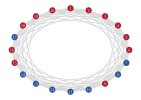

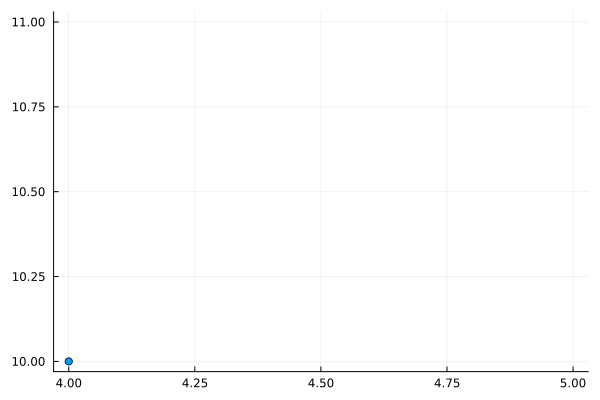

Test Summary: | Pass  Total  Time
Param & Model |    8      8  3.4s


In [4]:
@enum Strategy C D

@with_kw mutable struct Param
    N::Int = 100               # population
    k₀::Int = 2                # initial degree
    C_rate₀::Float64 = 0.5     # initial cooperator(C)'s freqtrialscy
    b::Float64 = 1.25          # benefit to defect
    resource_decrement_factor::Float64 = 0.9
    resource_limit::Float64 = 0.5
    ev_hop::Int = -1           # rich spot の移動幅 (場所)
    ev_interval::Int = 1       # rich spot の移動間隔 (時間)
    δ::Float64 = 0.99          # selection pressure
    μ::Float64 = 0.01          # mutation rate
    generations::Int = 2_000   # time steps
    trials::Int = 10           # trial count
    rng::MersenneTwister = MersenneTwister() # random generator
end

mutable struct Model
    # model's parameters
    p::Param
    rich_spot::Int # spot which has richest resource

    # agent's parameters
    strategy_vec::Vector{Strategy}  # agents' strategy
    resource_vec::Vector{Float64}   # agents' resource
    g::SimpleGraph

    function Model(p::Param)
        C_count = round(Int, p.N * p.C_rate₀)
        strategy_vec = shuffle(p.rng, vcat(fill(C, C_count), fill(D, p.N - C_count)))

        resource_vec = fill(0.0, p.N)

        g = create_cycle_graph(p.N, p.k₀)

        return new(p, 1, strategy_vec, resource_vec, g)
    end
end

C_rate(m::Model)::Float64 = mean([s == C for s in m.strategy_vec])

average_resource(m::Model)::Float64 = mean(m.resource_vec)

strategy_to_color_vec(m::Model)::Vector{RGB} = [s == C ? DARK_BLUE : DARK_RED for s in m.strategy_vec]

degree_distribution(g::SimpleGraph)::Dict{Int, Int} = countmap(degree(g))

function plot_graph(m::Model)::Nothing
    n = nv(m.g)
    θ = 2 * π / n  # 各ノードの間の角度
    x_coords = [cos(i * θ - π/2) for i in 0:n-1]
    y_coords = [sin(i * θ - π/2) for i in 0:n-1]

    # layout関数を定義してノードの座標を渡す
    layout = (g -> (x_coords, y_coords))

    gplot(m.g, nodelabel=1:m.p.N, layout=layout, nodelabelc=GRAY, nodefillc=strategy_to_color_vec(m)) |> display

    return
end

function plot_degree_distribution(g::SimpleGraph)::Nothing
    degree_count = sort(degree_distribution(g))
    xs = collect(keys(degree_count))
    ys = [degree_count[x] for x in xs]
    plot(xs, ys, seriestype=:scatter, legend=false) |> display
end

@testset "Param & Model" begin
    m = Model(Param())
    @test m.p.N == nv(m.g) == length(m.strategy_vec) == length(m.resource_vec) == 100
    @test C_rate(m) == 0.5
    @test m.resource_vec == fill(0.0, m.p.N)
    @test mean(degree(m.g)) == 2.0

    m = Model(Param(N = 10, k₀ = 4, C_rate₀ = 0.2))
    @test m.p.N == nv(m.g) == length(m.strategy_vec) == length(m.resource_vec) == 10
    @test C_rate(m) == 0.2
    @test m.resource_vec == fill(0.0, m.p.N)
    @test mean(degree(m.g)) == 4.0

    plot_graph(Model(Param(N = 20, k₀ = 10, C_rate₀ = 0.4)))
    plot_degree_distribution(m.g)
end;

## Resource allocation

In [5]:
function resource_allocation!(m::Model)::Nothing
    if m.p.ev_hop < 0
        m.rich_spot = rand(m.p.rng, 1:m.p.N)
    elseif m.p.ev_hop == 0
        # rich_spot is not moved
    else
        m.rich_spot = mod(m.rich_spot + rand(m.p.rng, -m.p.ev_hop:m.p.ev_hop) - 1, m.p.N) + 1
    end
    
    distance_vec = [abs(i - m.rich_spot) for i in 1:m.p.N]
    distance_vec = [distance > m.p.N ÷ 2 ? m.p.N - distance : distance for distance in distance_vec]
    m.resource_vec = [m.p.resource_decrement_factor^distance for distance in distance_vec]

    return
end

@testset "resource_allocation!" begin
    @testset "ev_hop = -1" begin
        m = Model(Param(N = 10, k₀ = 4, resource_decrement_factor = 0.5, rng = MersenneTwister(1)))
        resource_allocation!(m)
        @test m.rich_spot == 6
        @test m.resource_vec == [1/2^5, 1/2^4, 1/2^3, 1/2^2, 1/2, 1, 1/2, 1/2^2, 1/2^3, 1/2^4]

        m = Model(Param(N = 10, k₀ = 4, resource_decrement_factor = 0.5, rng = MersenneTwister(2)))
        resource_allocation!(m)
        @test m.rich_spot == 1
        @test m.resource_vec == [1, 1/2, 1/2^2, 1/2^3, 1/2^4, 1/2^5, 1/2^4, 1/2^3, 1/2^2, 1/2]
    end

    @testset "ev_hop = 1" begin
        m = Model(Param(N = 10, k₀ = 4, ev_hop  = 1, resource_decrement_factor = 0.5, rng = MersenneTwister(1)))
        prior_position = m.rich_spot
        hop_vec = []
        for _ in 1:100
            resource_allocation!(m)
            hop = prior_position - m.rich_spot
            hop = hop > 1 ? -1 : hop
            hop = hop < -1 ? 1 : hop
            append!(hop_vec, hop)
            prior_position = m.rich_spot
        end
        @test mean(hop_vec) ≈ 0.0 atol = 0.1
        @test std(hop_vec) ≈ 0.84 atol = 0.1
    end
end;

Test Summary:        | Pass  Total  Time
resource_allocation! |    6      6  0.0s


## Interaction

In [6]:
function interaction!(m::Model)::Vector{Tuple{Int, Int}}
    id_pair_vec = [(focal_id, rand(m.p.rng, neighbors(m.g, focal_id))) for focal_id in 1:m.p.N if length(neighbors(m.g, focal_id)) > 0]

    for (focal_id, opponent_id) in id_pair_vec
        strategy_pair = m.strategy_vec[[focal_id, opponent_id]]
        
        focal_resource, opponent_resource = [max(r - m.p.resource_limit, 0) for r in m.resource_vec[[focal_id, opponent_id]]]

        if focal_resource > 0 || opponent_resource > 0
            if strategy_pair == [C, C]
                poor_resource = (focal_resource + opponent_resource) * m.p.b
                m.resource_vec[focal_id] += poor_resource / 2 - focal_resource
                m.resource_vec[opponent_id] += poor_resource / 2 - opponent_resource
            elseif strategy_pair == [C, D]
                poor_resource = focal_resource * m.p.b
                m.resource_vec[focal_id] += poor_resource / 2 - focal_resource
                m.resource_vec[opponent_id] += poor_resource / 2
            elseif strategy_pair == [D, C]
                poor_resource = opponent_resource * m.p.b
                m.resource_vec[focal_id] += poor_resource / 2
                m.resource_vec[opponent_id] += poor_resource / 2 - opponent_resource
            else
                # if rand() > 0.9
                #     rem_edge!(m.g, focal_id, opponent_id)
                #     # add_edge!(m.g, sample(1:m.p.N, 2, replace = false)...)
                # end
            end
        end
    end

    return id_pair_vec
end

@testset "interaction!" begin
    @testset "normal" begin
        m = Model(Param(N = 10, k₀ = 4, C_rate₀ = 0.4, resource_decrement_factor = 0.5, resource_limit = 0.1, rng = MersenneTwister(1)))
        resource_allocation!(m)
        @test m.strategy_vec == [D, D, C, D, C, D, D, C, D, C]
        @test m.resource_vec == [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 0.5, 0.25, 0.125, 0.0625]

        pair_id_vec = interaction!(m)
        @test pair_id_vec == [(1, 3), (2, 10), (3, 5), (4, 6), (5, 7), (6, 5), (7, 9), (8, 10), (9, 1), (10, 1)]
        @test m.resource_vec == [0.08203125, 0.0625, 0.359765625, 0.25, 0.20147094726562498, 1.101470947265625, 0.662353515625, 0.19375, 0.125, 0.13515625]

        m = Model(Param(N = 10, k₀ = 4, C_rate₀ = 0.4, resource_decrement_factor = 0.5, resource_limit = 0.0, rng = MersenneTwister(1)))
        resource_allocation!(m)
        @test m.strategy_vec == [D, D, C, D, C, D, D, C, D, C]
        @test m.resource_vec == [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 0.5, 0.25, 0.125, 0.0625]

        id_pair_vec = interaction!(m)
        @test id_pair_vec == [(1, 3), (2, 10), (3, 5), (4, 6), (5, 7), (6, 5), (7, 9), (8, 10), (9, 1), (10, 1)]
        @test m.resource_vec == [0.2222900390625, 0.1015625, 0.361328125, 0.25, 0.141143798828125, 1.141143798828125, 0.725830078125, 0.1806640625, 0.125, 0.1129150390625]
    end
    
    @testset "solitary node" begin
        m = Model(Param(N = 10, k₀ = 4, C_rate₀ = 0.4, resource_decrement_factor = 0.5, resource_limit = 0.1, rng = MersenneTwister(1)))
        resource_allocation!(m)
        @test m.strategy_vec == [D, D, C, D, C, D, D, C, D, C]
        @test m.resource_vec == [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 0.5, 0.25, 0.125, 0.0625]

        # delete all edges of 3
        rem_edge!(m.g, 3, 1)
        rem_edge!(m.g, 3, 2)
        rem_edge!(m.g, 3, 4)
        rem_edge!(m.g, 3, 5)
        # delete all edges of 6 except (6, 5)
        rem_edge!(m.g, 6, 4)
        rem_edge!(m.g, 6, 7)
        rem_edge!(m.g, 6, 8)
        # delete all edges of 10
        rem_edge!(m.g, 10, 1)
        rem_edge!(m.g, 10, 2)
        rem_edge!(m.g, 10, 8)
        rem_edge!(m.g, 10, 9)

        id_pair_vec = interaction!(m)
        @test id_pair_vec == [(1, 2), (2, 4), (4, 5), (5, 7), (6, 5), (7, 5), (8, 9), (9, 8)]
        @test m.resource_vec == [0.03125, 0.0625, 0.125, 0.5, 0.16103515624999998, 1.09765625, 0.71728515625, 0.15859375, 0.27734375, 0.0625]
    end
end;

Test Summary: | Pass  Total  Time
interaction!  |   12     12  0.1s


## Death & Birth

In [7]:
mutate(strategy::Strategy)::Strategy = (strategy == C ? D : C)

function regularize_resource_vec(resource_vec::Vector{Float64}, positive::Bool)::Weights
    weights = positive ? resource_vec .- minimum(resource_vec) : maximum(resource_vec) .- resource_vec
    weights .+= 0.0001
    weights = weights ./ maximum(weights)

    return Weights(weights)
end

function death_birth!(m::Model)::Tuple{Vector{Int}, Vector{Int}}
    death_id_vec = findall(<(m.p.resource_limit), m.resource_vec)
    death_count = length(death_id_vec)
    if death_count == 0
        return Int[], Int[]
    end

    parent_weights = regularize_resource_vec(m.resource_vec, true)
    parent_id_vec = sort(sample(m.p.rng, 1:m.p.N, parent_weights, death_count, replace = false))

    # Strategy
    parent_strategy_vec = m.strategy_vec[parent_id_vec]
    parent_strategy_vec = [rand(m.p.rng) > m.p.μ ? s : mutate(s) for s in parent_strategy_vec]
    m.strategy_vec[death_id_vec] .= parent_strategy_vec

    # Graph
    ## Delete edges
    for death_id in death_id_vec
        neighbor_vec = copy(neighbors(m.g, death_id))
        for n in neighbor_vec
            rem_edge!(m.g, death_id, n)
        end
    end

    ## Add edges
    add_count = Int((m.p.N * m.p.k₀ / 2 - ne(m.g)) ÷ death_count)
    for death_id in death_id_vec
        for parent_id in sample(m.p.rng, parent_id_vec, add_count, replace = false)
            add_edge!(m.g, parent_id, death_id)
        end
    end

    return death_id_vec, parent_id_vec
end

@testset "regularize_resource_vec" begin
    @test regularize_resource_vec([0.0, 0.0, 0.0, 0.0, 0.0], true) == [1.0, 1.0, 1.0, 1.0, 1.0]
    @test regularize_resource_vec([1.0, 1.0, 1.0, 1.0, 1.0], true) == [1.0, 1.0, 1.0, 1.0, 1.0]

    @test regularize_resource_vec([0.0, 0.0, 1.0, 0.0, 0.0], true) ≈ [0.0, 0.0, 1.0, 0.0, 0.0] atol = 0.001
    @test regularize_resource_vec([0.0, 0.0, 1.0, 0.0, 0.0], false) ≈ [1.0, 1.0, 0.0, 1.0, 1.0] atol = 0.001
    @test regularize_resource_vec([0.0, 0.0, -1.0, 0.0, 0.0], true) ≈ [1.0, 1.0, 0.0, 1.0, 1.0] atol = 0.001

    @test regularize_resource_vec([0.0, 0.2, 0.4, 0.6, 0.8], true) ≈ [0.0, 0.25, 0.5, 0.75, 1.0] atol = 0.001
    @test regularize_resource_vec([0.0, 0.2, 0.4, 0.6, 0.8], false) ≈ [1.0, 0.75, 0.5, 0.25, 0.0] atol = 0.001
    @test regularize_resource_vec([0.0, -0.2, -0.4, -0.6, -0.8], true) ≈ [1.0, 0.75, 0.5, 0.25, 0.0] atol = 0.001
end

@testset "death_birth!" begin
    m = Model(Param(N = 10, k₀ = 4, C_rate₀ = 0.4, resource_limit = 0.2, resource_decrement_factor = 0.5, rng = MersenneTwister(1)))
    resource_allocation!(m)
    @test m.rich_spot == 6
    @test degree(m.g) == fill(4, 10)
    @test m.strategy_vec == [D, D, C, D, C, D, D, C, D, C]

    death_id_vec, parent_id_vec = death_birth!(m)
    @test death_id_vec == [1, 2, 3, 9, 10]
    @test parent_id_vec == [3, 4, 5, 6, 9]
    @test m.strategy_vec == [C, D, C, D, C, D, D, C, D, D]
    @test degree(m.g) == [2, 2, 3, 5, 3, 7, 3, 2, 4, 2]
    @test ne(m.g) == 17
end;

Test Summary:           | Pass  Total  Time
regularize_resource_vec |    8      8  0.1s
Test Summary: | Pass  Total  Time
death_birth!  |    8      8  0.3s


## Run all

In [8]:
function run!(m::Model)::Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}}
    C_rate_vec = fill(0.0, m.p.generations)
    average_resource_vec = fill(0.0, m.p.generations)
    death_count_vec = fill(0, m.p.generations)

    for generation in 1:m.p.generations
        if generation % m.p.ev_interval == 0
            resource_allocation!(m)
        end

        interaction!(m)
        death_id_vec, _ = death_birth!(m)
        
        C_rate_vec[generation] = C_rate(m)
        average_resource_vec[generation] = average_resource(m)
        death_count_vec[generation] = length(death_id_vec)
    end

    return C_rate_vec, average_resource_vec, death_count_vec
end;

# Results

## ToDo

- 選択強度
- 環境変動のインターバル
- 協力者同士が繋がりやすくする
- 複数試行結果を表示

In [9]:
ev_hop_vec = [0, 1, 4, 16, 64, -1]
resource_decrement_factor_vec = [0.5, 0.9]
resource_limit_vec = [0.1]

@show params = vec([(ev_hop, rdf, resource_limit) 
        for ev_hop in ev_hop_vec,
            rdf in resource_decrement_factor_vec,
            resource_limit in resource_limit_vec]);

params = vec([(ev_hop, rdf, resource_limit) for ev_hop = ev_hop_vec, rdf = resource_decrement_factor_vec, resource_limit = resource_limit_vec]) = [(0, 0.5, 0.1), (1, 0.5, 0.1), (4, 0.5, 0.1), (16, 0.5, 0.1), (64, 0.5, 0.1), (-1, 0.5, 0.1), (0, 0.9, 0.1), (1, 0.9, 0.1), (4, 0.9, 0.1), (16, 0.9, 0.1), (64, 0.9, 0.1), (-1, 0.9, 0.1)]


ev_hop: 0, resource_decrement_factor: 0.5, resource_limit: 0.1
C_rate: 0.08123438280859561
average_resource: 0.030000000000000072
[x for x = m.resource_vec if x > m.p.resource_limit] = [1.0, 0.5, 0.25, 0.125, 0.125, 0.25, 0.5]
Average Degree (k̄):	 3.9
Average Distance (L):	 3.4955555555555557
Average Clustering Coefficient (C):	 0.0471976401179941


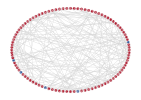

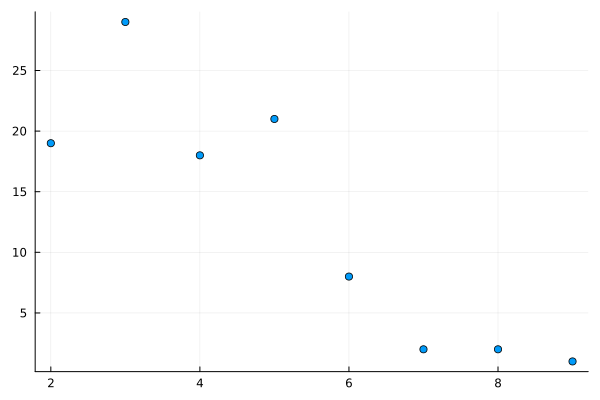

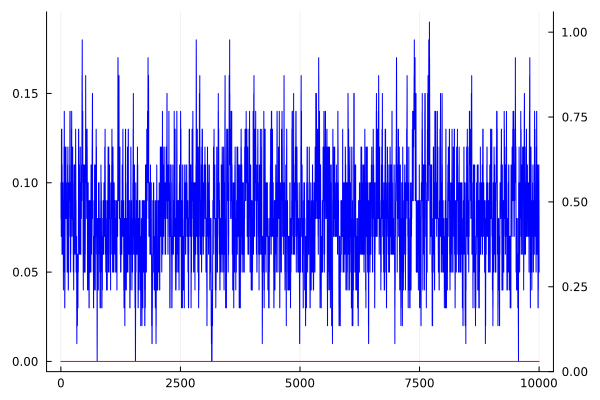

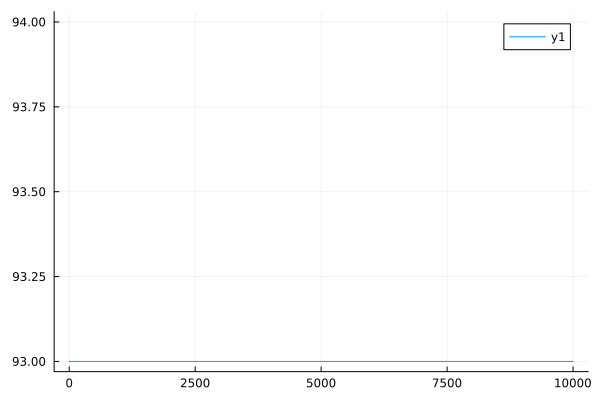

ev_hop: 1, resource_decrement_factor: 0.5, resource_limit: 0.1
C_rate: 0.16972513743128437
average_resource: 0.030960396894135867
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.125, 0.25, 0.5, 1.0, 0.5, 0.25, 0.125]
Average Degree (k̄):	 3.74
Average Distance (L):	 3.6521212121212123
Average Clustering Coefficient (C):	 0.033112582781456956


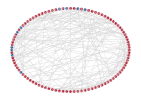

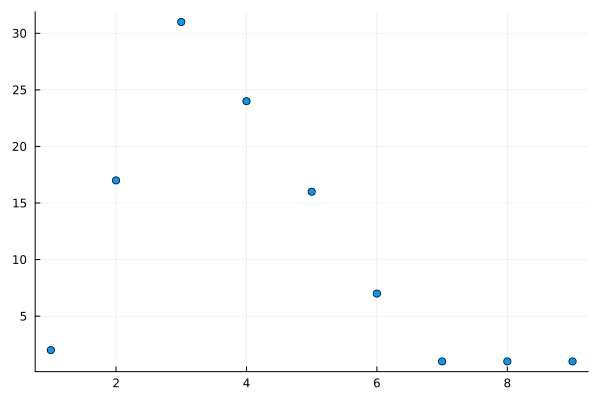

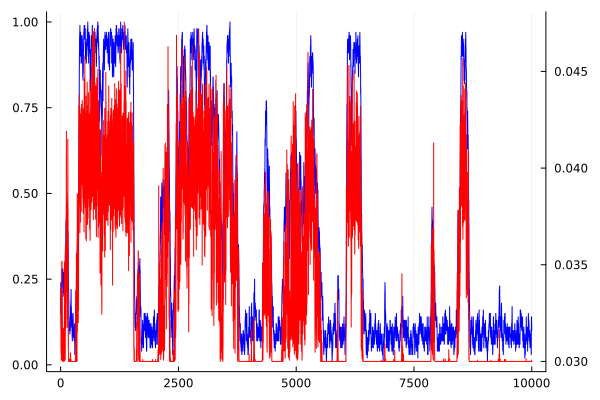

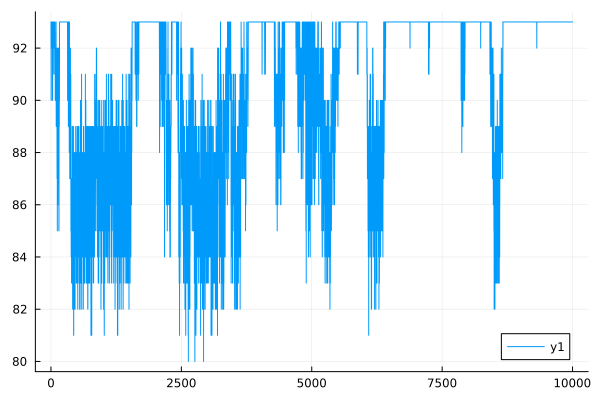

ev_hop: 4, resource_decrement_factor: 0.5, resource_limit: 0.1
C_rate: 0.2987506246876563
average_resource: 0.03234319962120173
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.125, 0.25, 0.5, 1.0, 0.5, 0.13662109375, 0.125]
Average Degree (k̄):	 3.76
Average Distance (L):	 3.59018759018759
Average Clustering Coefficient (C):	 0.037337662337662336


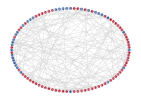

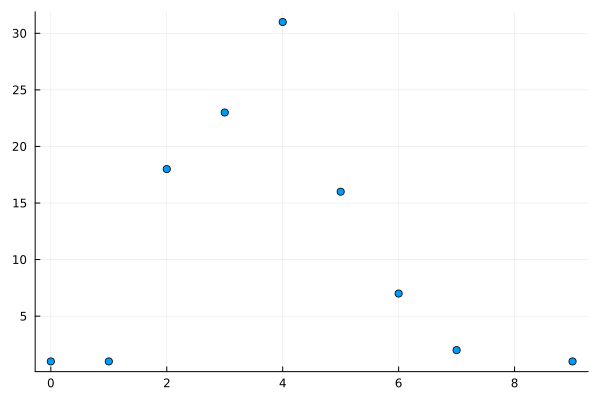

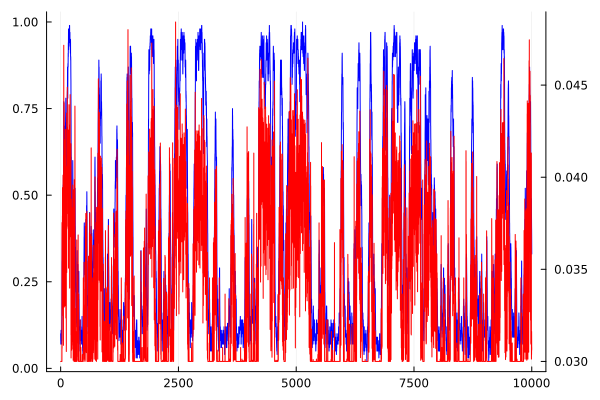

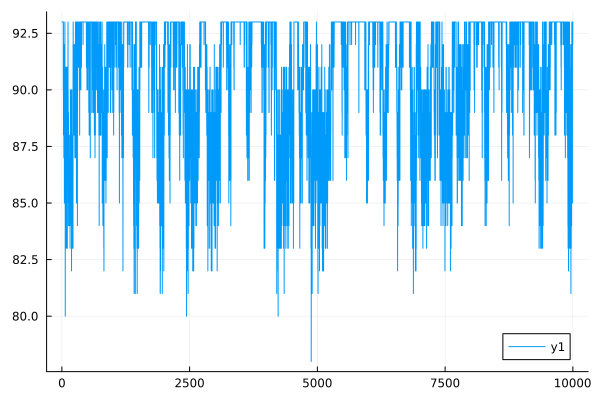

ev_hop: 16, resource_decrement_factor: 0.5, resource_limit: 0.1
C_rate: 0.5614542728635683
average_resource: 0.03546561586250424
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.2578125, 0.125, 0.25, 0.5, 0.6087890625000022, 0.25625, 0.13662109375, 0.106103515625, 0.3515777587890625, 0.15625000005820763, 0.15234375000045475, 0.6087890625000022]
Average Degree (k̄):	 3.68
Average Distance (L):	 3.6343022057307772
Average Clustering Coefficient (C):	 0.0429042904290429


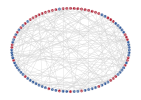

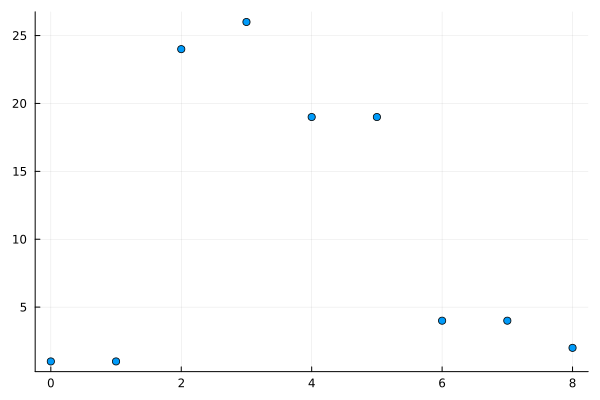

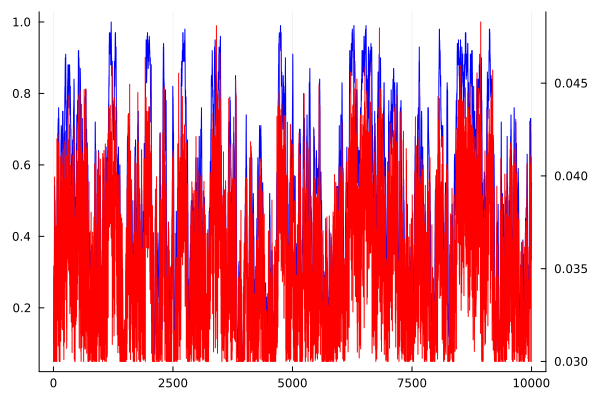

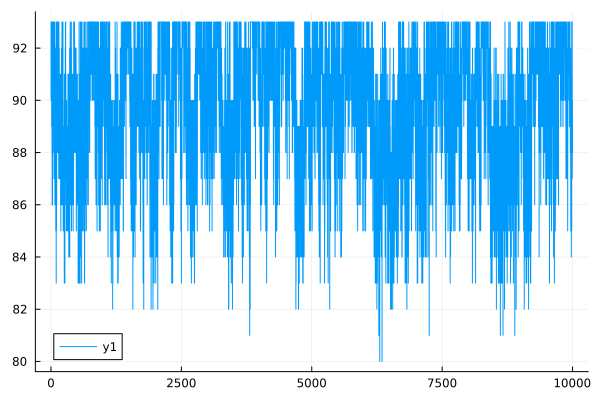

ev_hop: 64, resource_decrement_factor: 0.5, resource_limit: 0.1
C_rate: 0.5284657671164418
average_resource: 0.03479880181273825
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.2500009536743164, 0.152374267578125, 0.121728515625, 0.13662109375, 0.5, 1.009765625, 0.35, 0.13662109375, 0.121728515625]
Average Degree (k̄):	 3.72
Average Distance (L):	 3.5157575757575756
Average Clustering Coefficient (C):	 0.024691358024691357


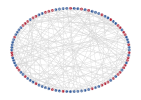

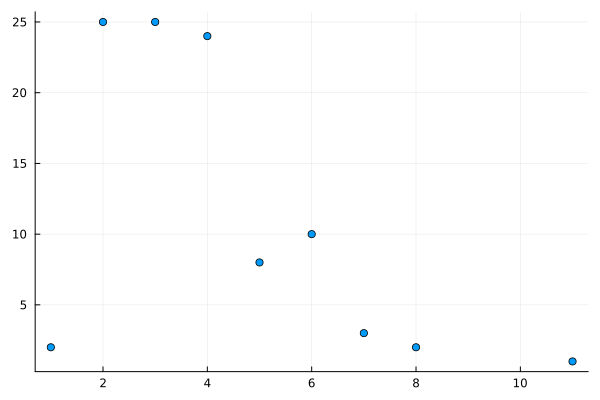

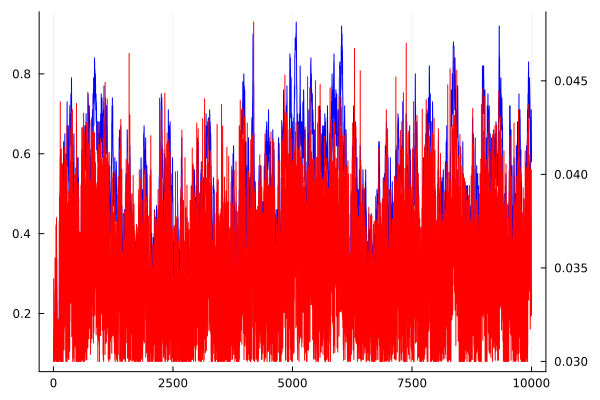

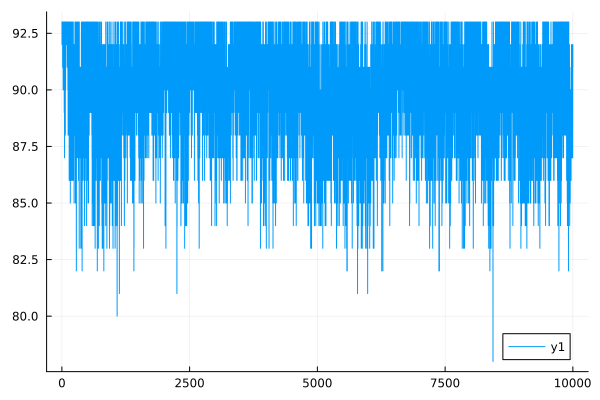

ev_hop: -1, resource_decrement_factor: 0.5, resource_limit: 0.1
C_rate: 0.5479710144927538
average_resource: 0.03508276172105284
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.37441408636514095, 0.106103515625, 0.15859375, 0.35, 0.47695312965661285, 0.35, 0.25, 0.109765625, 0.17404328847769648, 0.1523590087890625, 0.2715088039782131, 0.11846926156522386, 0.1715088039783268, 0.13662109375177636, 0.47695312965661285]
Average Degree (k̄):	 3.52
Average Distance (L):	 3.694141414141414
Average Clustering Coefficient (C):	 0.02142857142857143


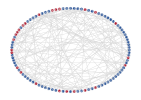

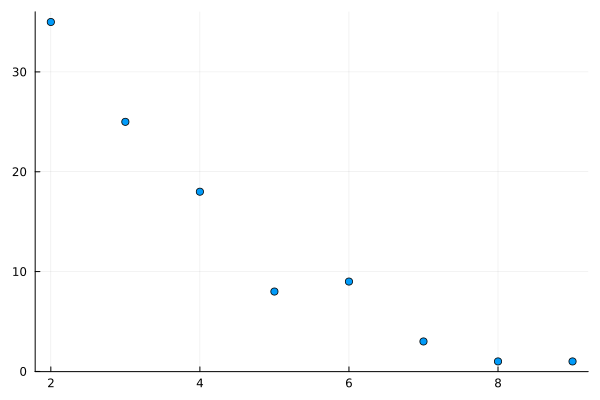

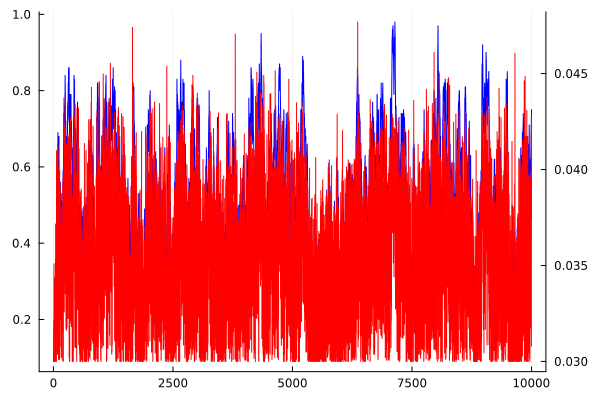

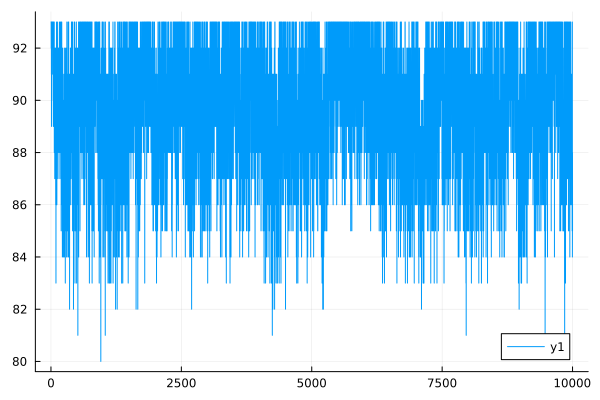

ev_hop: 0, resource_decrement_factor: 0.9, resource_limit: 0.1
C_rate: 0.17972013993003494
average_resource: 0.20460165563562702
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.4515625, 1.62109375, 0.27333984375, 0.7290000000000001, 0.23576660156249998, 0.5904900000000001, 0.531441, 0.4782969000000001, 0.4304672100000001, 0.5428445140625001, 0.13794531861877443, 0.3745231058800391, 0.21401846030062507, 0.2541865828329001, 0.2287679245496101, 0.11615770448221574, 0.18530201888518416, 0.20813554047113805, 0.15009463529699918, 0.14097203997449453, 0.1252559472200664, 0.10367929262949704, 0.11448170836807024, 0.5873174620449392, 0.14906939620979112, 0.12187362751190402, 0.108477011832702, 0.25310628682687253, 0.16465904777751683, 0.10941898913151242, 0.12157665459056935, 0.13508517176729928, 0.15009463529699918, 0.16677181699666577, 0.18530201888518416, 0.16618195755915566, 0.29494988210876577, 0.2541865828329001, 0.2824295364810001, 0.31381059609000006, 0.3486784401000001, 0.387

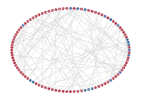

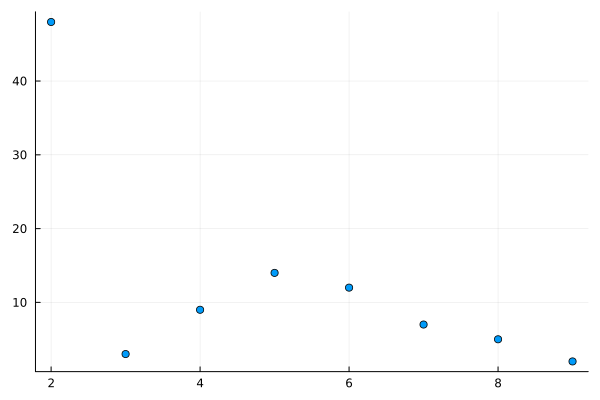

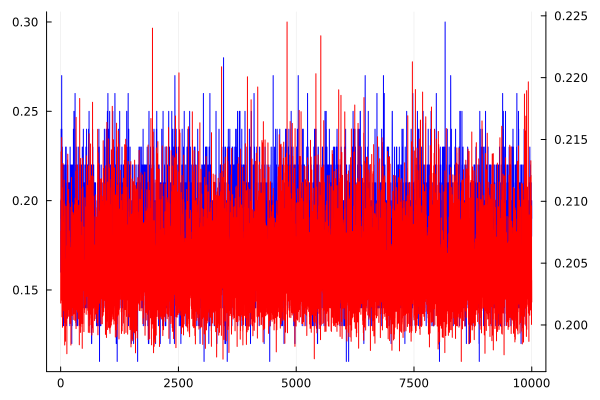

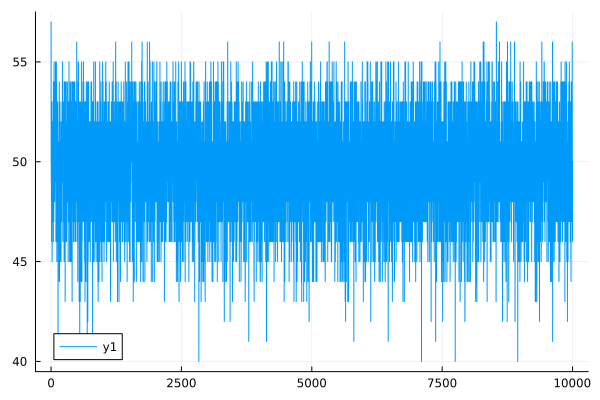

ev_hop: 1, resource_decrement_factor: 0.9, resource_limit: 0.1
C_rate: 0.011444277861069439
average_resource: 0.18904368373639327
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.10941898913151242, 0.12157665459056935, 0.13508517176729928, 0.15009463529699918, 0.16677181699666577, 0.18530201888518416, 0.20589113209464907, 0.2287679245496101, 0.2541865828329001, 0.2824295364810001, 0.31381059609000006, 0.3486784401000001, 0.3874204890000001, 0.4304672100000001, 0.4782969000000001, 0.531441, 0.5904900000000001, 0.6561, 0.7290000000000001, 0.81, 0.9, 1.0, 0.9, 0.81, 0.7290000000000001, 0.6561, 0.5904900000000001, 0.531441, 0.4782969000000001, 0.4304672100000001, 0.3874204890000001, 0.3486784401000001, 0.31381059609000006, 0.2824295364810001, 0.2541865828329001, 0.2287679245496101, 0.20589113209464907, 0.18530201888518416, 0.16677181699666577, 0.15009463529699918, 0.13508517176729928, 0.12157665459056935, 0.10941898913151242]
Average Degree (k̄):	 2.92
Average Distance (L):	 4.363

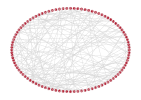

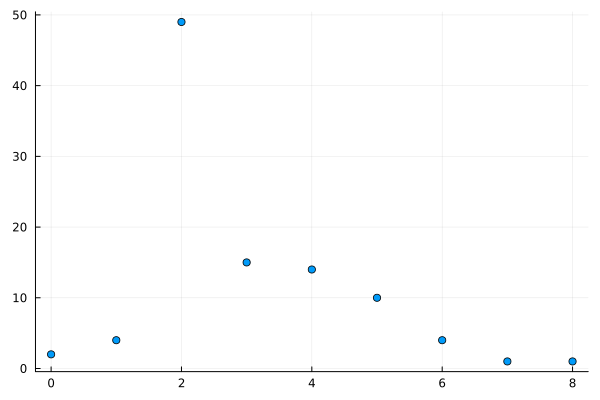

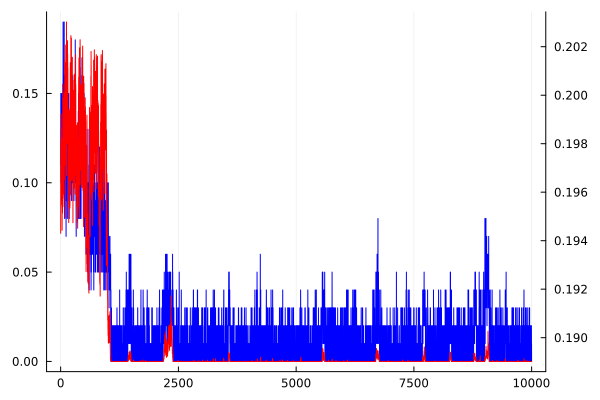

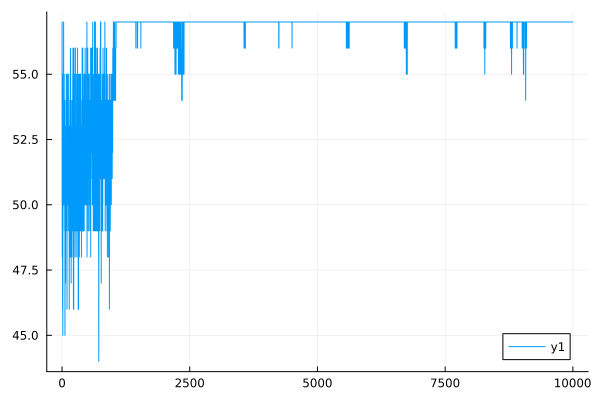

ev_hop: 4, resource_decrement_factor: 0.9, resource_limit: 0.1
C_rate: 0.692213893053473
average_resource: 0.2449502215801747
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.10229955789343566, 0.12157665459056935, 0.13508517176729928, 0.15009463529699918, 0.16677181699666577, 0.18530201888518416, 0.20589113209464907, 0.2287679245496101, 0.2541865828329001, 0.2824295364810001, 0.31381059609000006, 0.3486784401000001, 0.3874204890000001, 0.4304672100000001, 0.4782969000000001, 0.531441, 0.5904900000000001, 0.6561, 0.7290000000000001, 0.81, 0.9, 1.0, 0.9, 0.81, 0.7290000000000001, 0.6561, 0.5904900000000001, 0.531441, 0.4782969000000001, 0.4304672100000001, 0.3969866498366924, 0.3486784401000001, 0.31381059609000006, 0.2824295364810001, 0.2541865828329001, 0.2287679245496101, 0.20589113209464907, 0.18530201888518416, 0.16677181699666577, 0.15239419319043482, 0.13508517176729928, 0.12157665459056935, 0.10941898913151242]
Average Degree (k̄):	 2.96
Average Distance (L):	 4.4165656

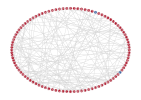

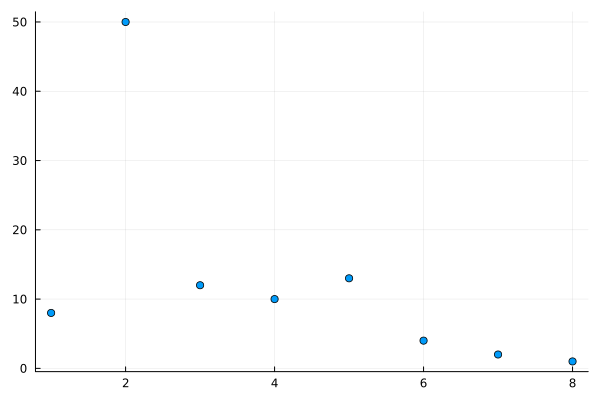

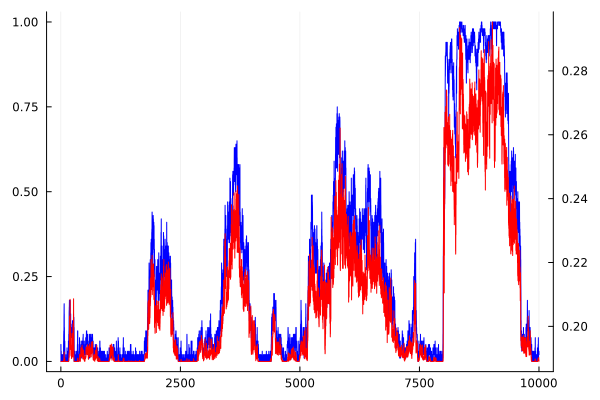

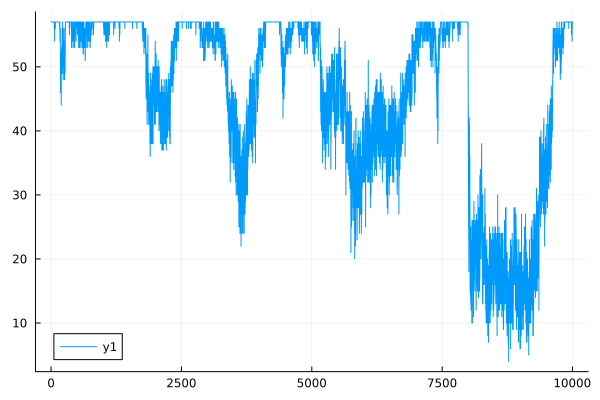

ev_hop: 16, resource_decrement_factor: 0.9, resource_limit: 0.1
C_rate: 0.1240929535232384
average_resource: 0.1964268310633867
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.25468356613140075, 0.1417365705043484, 0.1307034524734877, 0.15602207962158018, 0.10597454236673906, 0.2351904681393726, 0.10588686820719527, 0.12157665459056935, 0.13508517176729928, 0.11956821691289031, 0.16677181699666577, 0.18530201888518416, 0.20589113209464907, 0.2287679245496101, 0.22221894144210774, 0.14453846105493168, 0.31381059609000006, 0.1607125097900391, 0.27963780562500007, 0.4304672100000001, 0.4782969000000001, 0.531441, 0.5904900000000001, 0.6561, 0.345703125, 0.8452560116099008, 0.9508773639735149, 1.0763868384013173, 0.9, 0.81, 0.9747031250000001, 0.6561, 0.6399974580458838, 0.5373278682071954, 0.15772352600097658, 0.4304672100000001, 0.3874204890000001, 0.42789037297341415, 0.31381059609000006, 0.2824295364810001, 0.12352700543714906, 0.2287679245496101, 0.11864913046907162, 0.18530

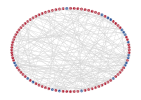

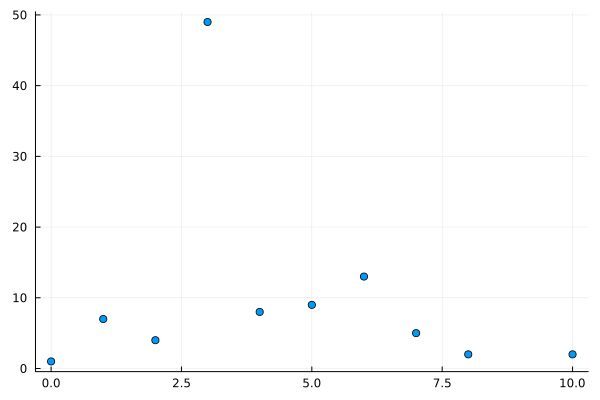

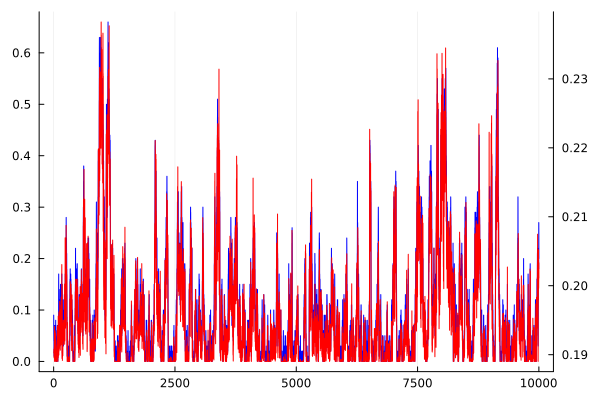

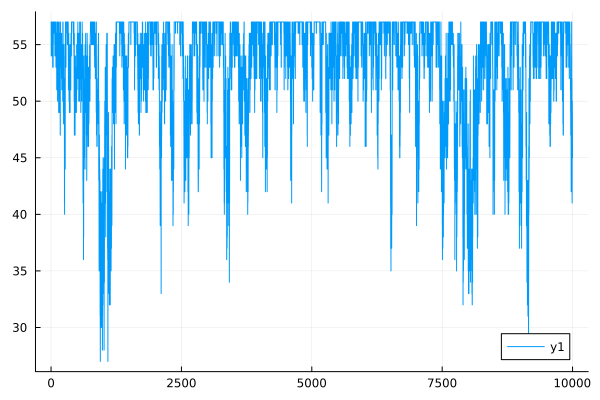

ev_hop: 64, resource_decrement_factor: 0.9, resource_limit: 0.1
C_rate: 0.12759620189905047
average_resource: 0.19559270987718122
[x for x = m.resource_vec if x > m.p.resource_limit] = [1.0, 0.4125, 0.81, 0.7290000000000001, 0.6561, 0.29159765625, 0.531441, 0.4782969000000001, 0.30654200625000005, 0.39330735720719534, 0.3486784401000001, 0.31381059609000006, 0.2824295364810001, 0.19636661427056257, 0.15029997052719146, 0.20589113209464907, 0.18530201888518416, 0.16677181699666577, 0.15009463529699918, 0.13508517176729928, 0.10526773793715073, 0.10941898913151242, 0.1307034524734877, 0.22479000988140083, 0.4086377341914973, 0.1034362647607136, 1.0247684231470224, 0.21187321584044533, 0.10588686820719527, 0.12157665459056935, 0.13508517176729928, 0.45665088529699926, 0.16677181699666577, 0.18530201888518416, 0.20589113209464907, 0.2287679245496101, 0.19636661427056257, 0.2824295364810001, 0.39429054893350635, 0.3486784401000001, 0.3874204890000001, 0.30654200625000005, 0.4782969000000001

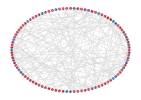

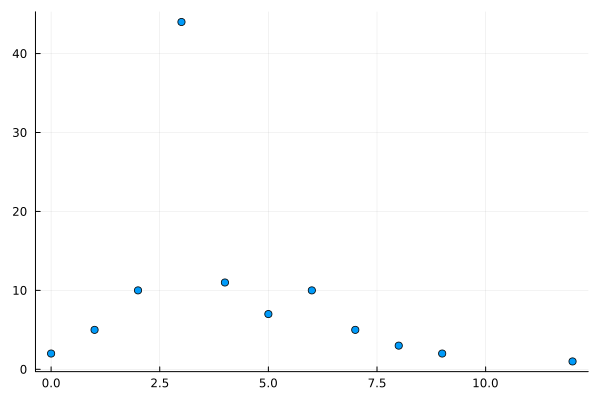

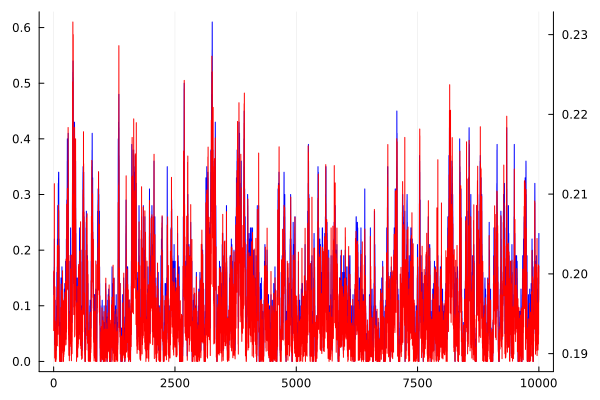

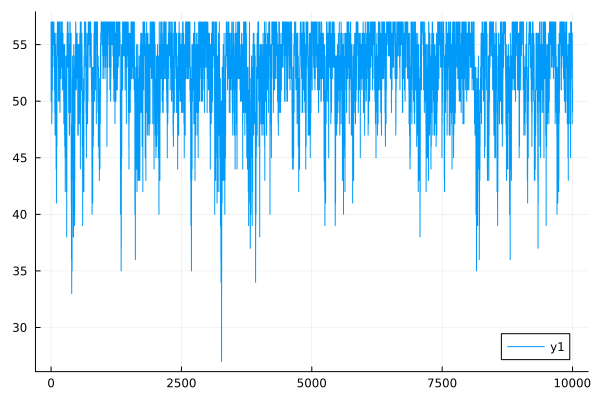

ev_hop: -1, resource_decrement_factor: 0.9, resource_limit: 0.1
C_rate: 0.11977011494252872
average_resource: 0.19520515044398895
[x for x = m.resource_vec if x > m.p.resource_limit] = [0.507855167211279, 0.2528587657682607, 0.10588686820719527, 0.12157665459056935, 0.13508517176729928, 0.15009463529699918, 0.16677181699666577, 0.18530201888518416, 0.20589113209464907, 0.2287679245496101, 0.2541865828329001, 0.2824295364810001, 0.31381059609000006, 0.3486784401000001, 0.3874204890000001, 0.4304672100000001, 0.4782969000000001, 1.0392535, 0.5904900000000001, 0.6561, 0.7290000000000001, 0.81, 0.2953125, 1.0, 0.9, 0.81, 0.8767722265625001, 0.6561, 0.5904900000000001, 0.531441, 0.24777222656250003, 0.4304672100000001, 0.27963780562500007, 0.3486784401000001, 0.31381059609000006, 0.2824295364810001, 0.2541865828329001, 0.2287679245496101, 0.20589113209464907, 0.18530201888518416, 0.16677181699666577, 0.15009463529699918, 0.13508517176729928, 0.12157665459056935, 0.10941898913151242, 0.21397

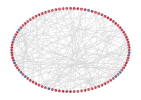

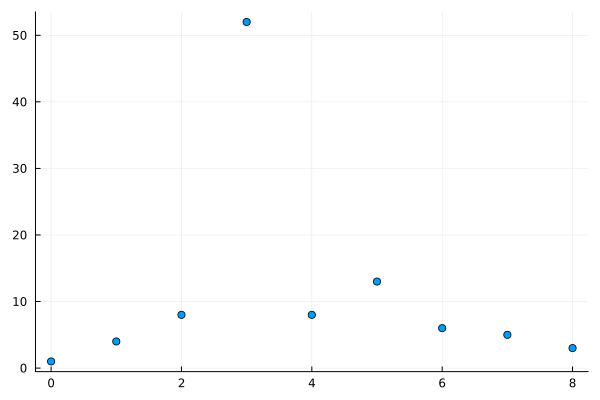

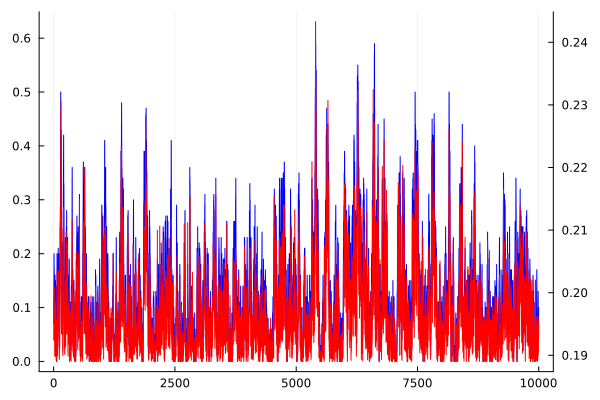

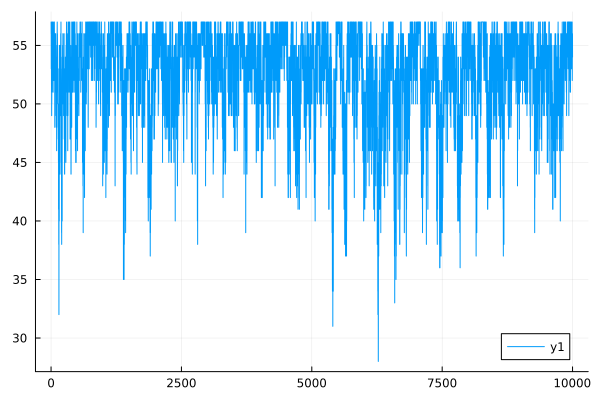

In [11]:
for (ev_hop, resource_decrement_factor, resource_limit) in params
    p = Param(
        N = 100, k₀ = 4, C_rate₀ = 0.1, generations = 10_000,
        ev_hop = ev_hop,
        resource_decrement_factor = resource_decrement_factor,
        resource_limit = resource_limit
    )
    m = Model(p)
    C_rate_vec, average_resource_vec, death_count_vec = run!(m)
    
    println("ev_hop: $(ev_hop), resource_decrement_factor: $(resource_decrement_factor), resource_limit: $(resource_limit)")
    println("C_rate: $(mean(C_rate_vec[round(Int, end * 0.8):end]))")
    println("average_resource: $(mean(average_resource_vec[round(Int, end * 0.8):end]))")
    @show [x for x in m.resource_vec if x > m.p.resource_limit]
    desc(m.g)
    plot_graph(m)
    plot_degree_distribution(m.g)
    
    p = plot(C_rate_vec, label=false, color=:blue)
    plot!(twinx(), average_resource_vec, label=false, color=:red)
    display(p)
    
    plot(death_count_vec) |> display
end